In [2]:
from sklearn.datasets import fetch_openml
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

In [59]:
import time

import numpy as np
import pandas as pd

%matplotlib inline
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

import seaborn as sns
import plotly.express as plotly_express
import warnings
warnings.filterwarnings('ignore')

In [6]:
import ssl
ssl._create_default_https_context = ssl._create_unverified_context

# Feature extraction for MNIST data

## Getting MNIST data

In this test, we just use the hand written digit data of MNIST, which contains 70000 28 x 28 images.

In [25]:
mnist = fetch_openml("mnist_784")
X = mnist.data / 255.0
y = mnist.target

print(X.shape, y.shape)

(70000, 784) (70000,)


In [21]:
X.head()

,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,pixel10,...,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,pixel784
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


Check the first 10 images:

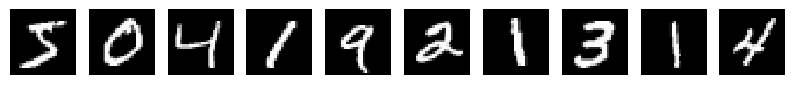

In [115]:
fig, ax = plt.subplots(1, 10, figsize=(10, 5))
for i in range(10):
    ax[i].matshow(X.loc[i,].values.reshape((28,28)).astype(float))
    ax[i].axis('off')


## PCA

In [70]:
pca = PCA(n_components=20)
pca_result = pca.fit_transform(X.values)

df=pd.DataFrame()
df['pc1'] = pca_result[:,0]
df['pc2'] = pca_result[:,1] 
df['pc3'] = pca_result[:,2]
df['y']=y

print('Explained variation per PC:\n {}'.format(pca.explained_variance_ratio_))

Explained variation per PC:
 [0.09746116 0.07155445 0.06149531 0.05403385 0.04888934 0.04305227
 0.03278262 0.02889642 0.02758364 0.0234214  0.02106689 0.02037553
 0.01707063 0.01694019 0.01583381 0.01486332 0.0131934  0.01278977
 0.01187215 0.01152837]


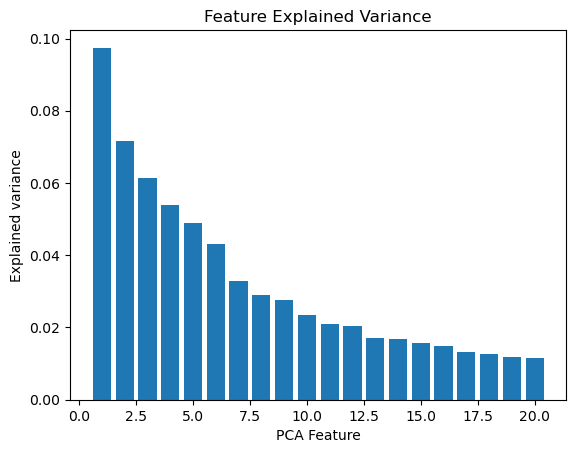

In [69]:
plt.bar(
    range(1,len(pca.explained_variance_)+1),
    pca.explained_variance_ratio_
    )


plt.xlabel('PCA Feature')
plt.ylabel('Explained variance')
plt.title('Feature Explained Variance')
plt.show()

We can see there is not an obvious elbow, and each PC accounts for only a small portion of variance.

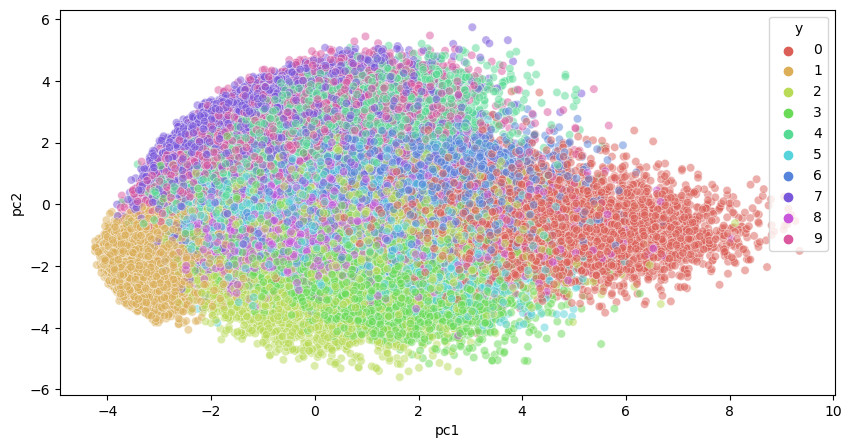

In [80]:
plt.figure(figsize=(10,5))
sns.scatterplot(
    x="pc1", y="pc2",
    hue="y",
    palette=sns.color_palette("hls", 10),
    data=df,
    legend="full",
    alpha=0.5
)
plt.show()

Some clusters are formed, but there are still a lot of overlapping zones. Let's use the first 3 PCs to plot.

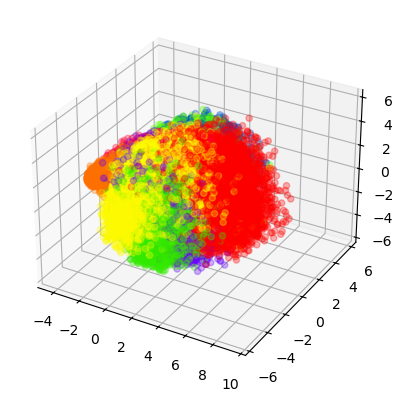

In [62]:
ax = plt.axes(projection='3d')
ax.scatter3D(df['pc1'], df['pc2'], df['pc3'], c=[df['y']], cmap='prism', alpha=0.3)

plt.show()

Try with plotly for a zoomable & rotatable plot

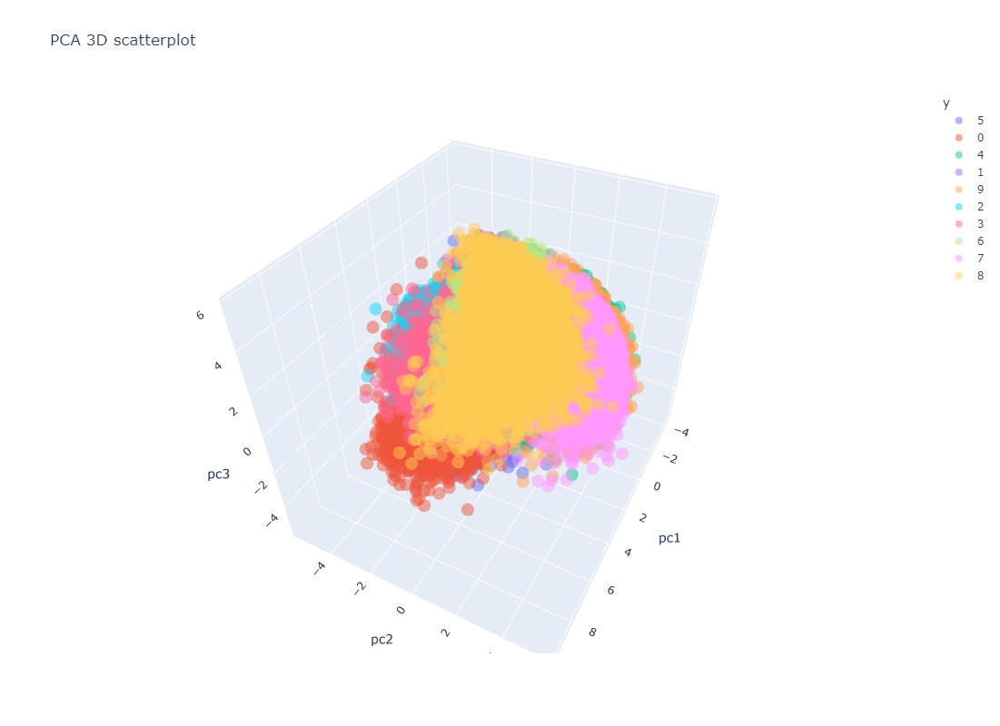

In [90]:
figure = plotly_express.scatter_3d(df,
                 x='pc1', y='pc2',
                 z='pc3', color="y", 
                 title="PCA 3D scatterplot", opacity=0.5, width=800, height=800)
figure.update_layout(showlegend=True)
 
figure.show()

## t-SNE

We believe some kind of non-linear relationship in the data causes it difficult to separate using PCA. This is moment to try t-SNE.

In [72]:
time_start = time.time()
tsne = TSNE(n_components=3, verbose=1, perplexity=40, n_iter=300)
tsne_results = tsne.fit_transform(X)
print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 70000 samples in 0.270s...
[t-SNE] Computed neighbors for 70000 samples in 93.283s...
[t-SNE] Computed conditional probabilities for sample 1000 / 70000
[t-SNE] Computed conditional probabilities for sample 2000 / 70000
[t-SNE] Computed conditional probabilities for sample 3000 / 70000
[t-SNE] Computed conditional probabilities for sample 4000 / 70000
[t-SNE] Computed conditional probabilities for sample 5000 / 70000
[t-SNE] Computed conditional probabilities for sample 6000 / 70000
[t-SNE] Computed conditional probabilities for sample 7000 / 70000
[t-SNE] Computed conditional probabilities for sample 8000 / 70000
[t-SNE] Computed conditional probabilities for sample 9000 / 70000
[t-SNE] Computed conditional probabilities for sample 10000 / 70000
[t-SNE] Computed conditional probabilities for sample 11000 / 70000
[t-SNE] Computed conditional probabilities for sample 12000 / 70000
[t-SNE] Computed conditional probabilities for s

In [76]:
tsne_results.shape

(70000, 3)

In [78]:
df_tsne=pd.DataFrame()
df_tsne['tsne1']=tsne_results[:,0]
df_tsne['tsne2']=tsne_results[:,1]
df_tsne['tsne3']=tsne_results[:,2]
df_tsne['y']=y

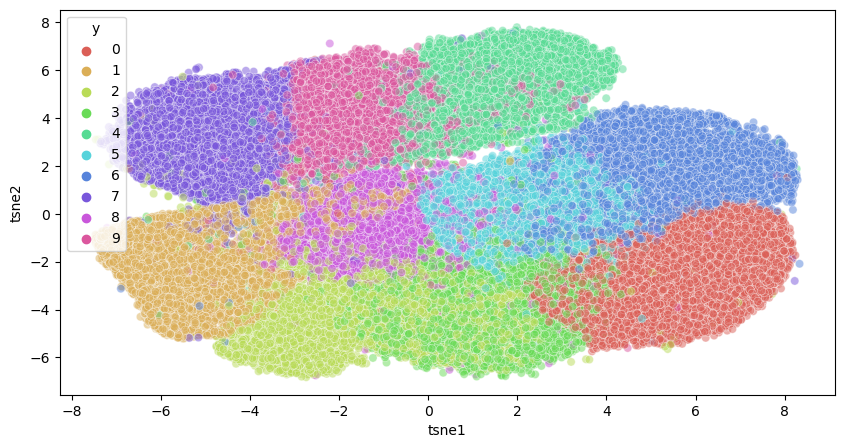

In [81]:
plt.figure(figsize=(10,5))
sns.scatterplot(
    x='tsne1', y='tsne2',
    hue="y",
    palette=sns.color_palette("hls", 10),
    data=df_tsne,
    legend="full",
    alpha=0.5
)
plt.show()

The numbers are obviously more separatable. Let's check the 3D plot.

In [92]:
figure = plotly_express.scatter_3d(df_tsne,
                 x='tsne1', y='tsne2',
                 z='tsne3', color="y", 
                 title="TSNE 3D scatterplot", opacity=0.3, width=800, height=800)
figure.update_layout(showlegend=True)
 
figure.show()

## Combine PCA and t-SNE

It seems that 2 dimension of t-SNE can already effectively distinguish the digits. Next we try to first reduce the dimension by PCA, then feed the output to t-SNE to obtain a 2 dimension features.

Explained variation per PC:
 [0.09746116 0.07155445 0.06149531 0.05403385 0.04888934 0.04305227
 0.03278262 0.02889642 0.02758364 0.0234214  0.02106689 0.02037553
 0.01707064 0.0169402  0.01583382 0.01486345 0.01319358 0.01279014
 0.01187272 0.01152937 0.0106604  0.01009794 0.00959151 0.00909635
 0.00883287 0.00838818 0.00809832 0.00785718 0.00740262 0.00690014
 0.00656144 0.0064547  0.00600819 0.00585611 0.00566753 0.0054347
 0.00504717 0.00487077 0.00478951 0.00467591 0.00454367 0.00444913
 0.00418212 0.00396159 0.00383703 0.00375771 0.0036142  0.00349007
 0.0033872  0.00319686 0.00316828 0.00310114 0.00296404 0.00287049
 0.00282462 0.00269354 0.00268323 0.00256473 0.00253115 0.0024451
 0.00239543 0.00238492 0.00229061 0.0022077  0.00212667 0.00205985
 0.00202061 0.00194678 0.00190164 0.00187811 0.00186411 0.00178658
 0.00175229 0.0017132  0.00163564 0.00161102 0.0015672  0.00152876
 0.00141604 0.00139449]
Cumulative explained variation for 80 principal components: 0.8907458574915355

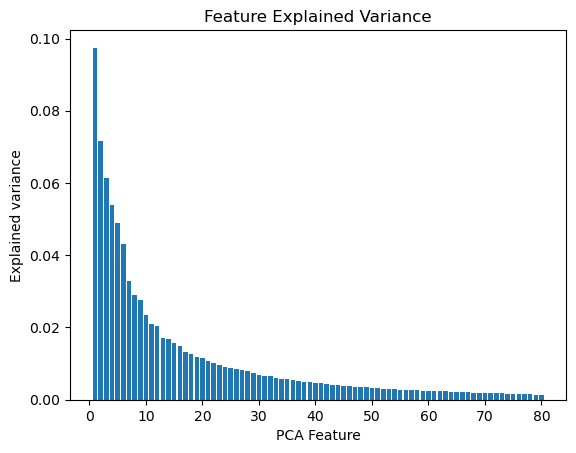

In [96]:
pca2 = PCA(n_components=80)
pca_result2 = pca2.fit_transform(X.values)

print('Explained variation per PC:\n {}'.format(pca2.explained_variance_ratio_))
print('Cumulative explained variation for 80 principal components: {}'.format(np.sum(pca2.explained_variance_ratio_)))
plt.bar(
    range(1,len(pca2.explained_variance_)+1),
    pca2.explained_variance_ratio_
    )


plt.xlabel('PCA Feature')
plt.ylabel('Explained variance')
plt.title('Feature Explained Variance')
plt.show()

In [98]:
time_start = time.time()

tsne2 = TSNE(n_components=2, verbose=0, perplexity=40, n_iter=300)
tsne_pca_results2 = tsne2.fit_transform(pca_result2)

print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

t-SNE done! Time elapsed: 220.5598645210266 seconds


In [99]:
df_tsne2=pd.DataFrame()
df_tsne2['tsne1']=tsne_pca_results2[:,0]
df_tsne2['tsne2']=tsne_pca_results2[:,1]
df_tsne2['y']=y

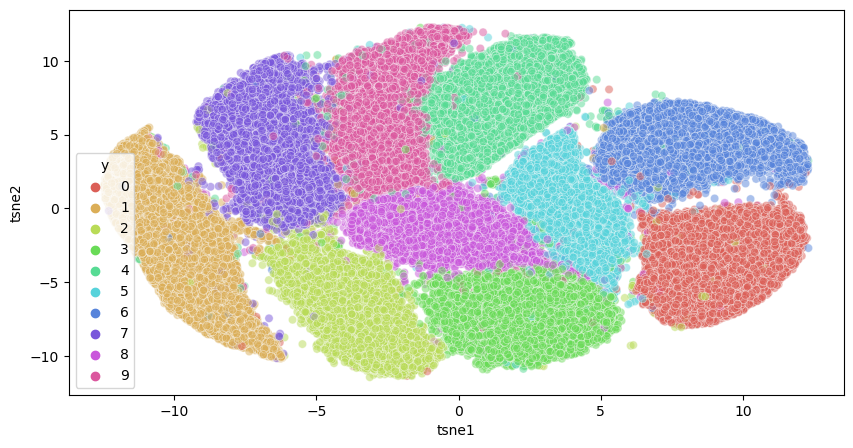

In [100]:
plt.figure(figsize=(10,5))
sns.scatterplot(
    x='tsne1', y='tsne2',
    hue="y",
    palette=sns.color_palette("hls", 10),
    data=df_tsne2,
    legend="full",
    alpha=0.5
)
plt.show()

The result shows a significant improvement against normal PCA.

# Applying on Fashion MNIST data

In [117]:
fmnist = fetch_openml("Fashion-MNIST")
FX = fmnist.data / 255.0
Fy = fmnist.target

print(FX.shape, Fy.shape)

(70000, 784) (70000,)


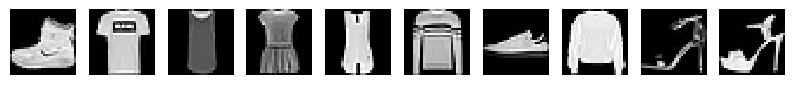

In [118]:
fig, ax = plt.subplots(1, 10, figsize=(10, 5))
for i in range(10):
    ax[i].matshow(FX.loc[i,].values.reshape((28,28)).astype(float))
    ax[i].axis('off')

Explained variation per PC:
 [0.2905654  0.17738509 0.06017611 0.04956367 0.03844974 0.03458849
 0.0234521  0.01904302 0.01343939 0.01311725 0.00992088 0.00914339
 0.00764499 0.00657458 0.00609407 0.00588735 0.00552509 0.00526263
 0.00459548 0.0045471  0.00434383 0.00407134 0.00384781 0.00372353
 0.00361434 0.00349545 0.00333643 0.00318288 0.00308728 0.00294123
 0.00275806 0.00265864 0.00263734 0.00256467 0.00246683 0.00236363
 0.0022993  0.00224804 0.00219177 0.00208793 0.00199354 0.00196118
 0.00194203 0.00182682 0.00175054 0.0017103  0.0016801  0.00163926
 0.00161575 0.00155074 0.00152807 0.00150274 0.00146862 0.0014298
 0.00138167 0.00136845 0.00130861 0.00128588 0.00126861 0.00125343
 0.0012089  0.00119862 0.00117358 0.00115763 0.0011544  0.0011156
 0.00110049 0.00108808 0.00103894 0.00102596 0.00101405 0.00100347
 0.00095944 0.00094032 0.00092234 0.00091184 0.00087237 0.00087042
 0.0008551  0.00084675]
Cumulative explained variation for 80 principal components: 0.8968206160654032

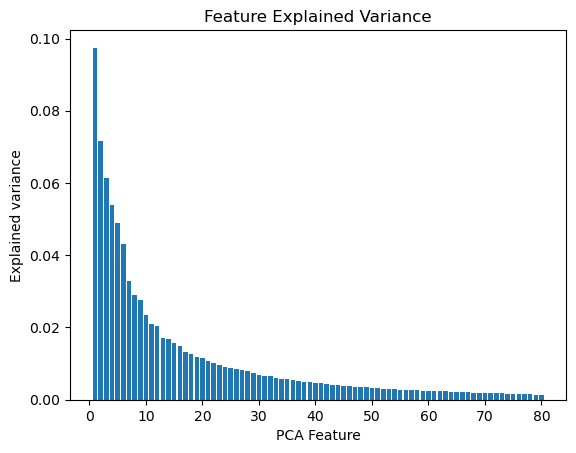

In [119]:
fpca = PCA(n_components=80)
fpca_result = fpca.fit_transform(FX.values)

print('Explained variation per PC:\n {}'.format(fpca.explained_variance_ratio_))
print('Cumulative explained variation for 80 principal components: {}'.format(np.sum(fpca.explained_variance_ratio_)))
plt.bar(
    range(1,len(fpca.explained_variance_)+1),
    pca2.explained_variance_ratio_
    )


plt.xlabel('PCA Feature')
plt.ylabel('Explained variance')
plt.title('Feature Explained Variance')
plt.show()

In [120]:
time_start = time.time()

ftsne = TSNE(n_components=2, verbose=0, perplexity=40, n_iter=300)
ftsne_pca_results = ftsne.fit_transform(fpca_result)

print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

t-SNE done! Time elapsed: 184.49646377563477 seconds


In [121]:
Fdf=pd.DataFrame()
Fdf['tsne1']=ftsne_pca_results[:,0]
Fdf['tsne2']=ftsne_pca_results[:,1]
Fdf['y']=Fy

In [128]:
mapping_dict = {"0":"T-shirt/top",
"1": "Trouser",
"2": "Pullover",
"3": "Dress",
"4": "Coat",
"5": "Sandal",
"6": "Shirt",
"7": "Sneaker",
"8": "Bag",
"9": "Ankle boot"
}
Fdf['ylab'] = Fdf['y'].map(mapping_dict)

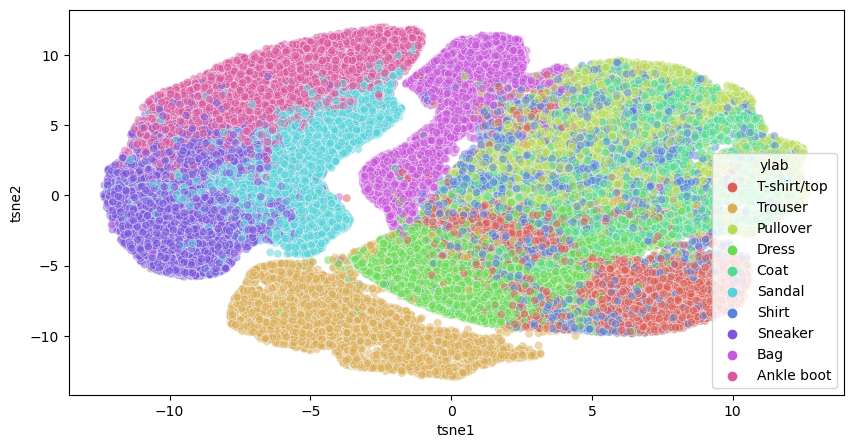

In [129]:
plt.figure(figsize=(10,5))
sns.scatterplot(
    x='tsne1', y='tsne2',
    hue="ylab",
    palette=sns.color_palette("hls", 10),
    data=Fdf,
    legend="full",
    alpha=0.5
)
plt.show()

We can see that shoewears are grouped together, tops are on the other side, while bags and trousers are also seperated from the two large groups.
Without using any 2D positional information, t-SNE can still capture a large amount of the information of complex data while significantly reducing the dimensions.

Compare to just using the first 2 PCs:

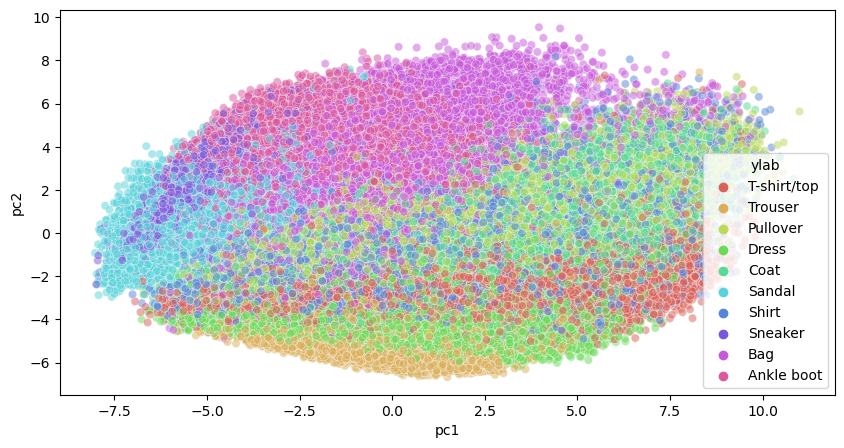

In [131]:
Fdf['pc1']=fpca_result[:,0]
Fdf['pc2'] =fpca_result[:,1] 

plt.figure(figsize=(10,5))
sns.scatterplot(
    x="pc1", y="pc2",
    hue="ylab",
    palette=sns.color_palette("hls", 10),
    data=Fdf,
    legend="full",
    alpha=0.5
)
plt.show()